# Download chembl with chembl_downloader to easily query data

In [61]:
import chembl_downloader
import chembl_downloader.contrib

#path = chembl_downloader.download_extract_sqlite(version='34')

In [62]:
# test if it worked
chembl_downloader.query("SELECT canonical_smiles, molregno FROM COMPOUND_STRUCTURES")

,canonical_smiles,molregno
0,Cc1cc(-n2ncc(=O)[nH]c2=O)ccc1C(=O)c1ccccc1Cl,1
1,Cc1cc(-n2ncc(=O)[nH]c2=O)ccc1C(=O)c1ccc(C#N)cc1,2
2,Cc1cc(-n2ncc(=O)[nH]c2=O)cc(C)c1C(O)c1ccc(Cl)cc1,3
3,Cc1ccc(C(=O)c2ccc(-n3ncc(=O)[nH]c3=O)cc2)cc1,4
4,Cc1cc(-n2ncc(=O)[nH]c2=O)ccc1C(=O)c1ccc(Cl)cc1,5
...,...,...
2409265,COc1ccc(-c2nc(NCCN3CCOCC3)c3cc(OC)ccc3n2)cc1,2833875
2409266,C[C@@H]1[C@@H](C)[C@H](C)O[C@@H](O[C@@H]2[C@@H...,2833876
2409267,C[C@@H]1CN(c2ccncc2NC(=O)c2ccnn3cc(-c4ccccc4)n...,2833877
2409268,NCCCC[C@@H]1NC(=O)[C@@H](Cc2c[nH]c3ccccc23)NC(...,2833878


In [3]:
#other way to get mols but its pretty slow. just as a nota bene
chembl_downloader.contrib.get_target_smi_df("CHEMBL5314328", version="34", aggregate=None, refresh=False)

,assay_chembl_id,target_type,tax_id,canonical_smiles,molecule_chembl_id,standard_type,pchembl_value


In [63]:
#functino for calculating scaffolds. note that this just make rdkit murkco like scaggold currently

from rdkit import Chem
from rdkit.Chem.Scaffolds import MurckoScaffold
from collections import Counter


#currently this calculates rdkit murcko like scaffold
def csk(smi):
    try:
        mol = Chem.MolFromSmiles(smi)
        sca = MurckoScaffold.GetScaffoldForMol(mol)
        #sca = MurckoScaffold.MakeScaffoldGeneric(sca)
        #sca = MurckoScaffold.GetScaffoldForMol(sca)
        sca = Chem.MolToSmiles(Chem.MolFromSmiles(Chem.MolToSmiles(sca))) # needed for proper cannonizatoin
    except Exception as e:
        sca=None
        #print(e)
    return sca

In [64]:
# get all relevant data (takes about 20 sec)
df = chembl_downloader.query("""SELECT activities.activity_id,
                activities.assay_id,
                activities.molregno,
                activities.standard_relation ,
                activities.standard_value,
                activities.standard_units,
                activities.standard_flag,
                activities.standard_type,
                activities.activity_comment,
                activities.pchembl_value,
                assays.confidence_score,
                assays.assay_type,
                target_dictionary.target_type as tgt_type,
                target_dictionary.pref_name as tgt_pref_name,
                target_dictionary.chembl_id as tgt_chembl_id,
                target_dictionary.organism,
                assays.tid
                FROM activities,
                assays,
                target_dictionary,
                target_components
                WHERE activities.assay_id = assays.assay_id
                AND assays.tid = target_dictionary.tid
                AND target_dictionary.tid = target_components.tid
                AND activities.standard_relation = '='
                AND assays.confidence_score IN ('7','8', '9')
                AND pchembl_value > 6""")

In [65]:
df

,activity_id,assay_id,molregno,standard_relation,standard_value,standard_units,standard_flag,standard_type,activity_comment,pchembl_value,confidence_score,assay_type,tgt_type,tgt_pref_name,tgt_chembl_id,organism,tid
0,31872,154606,253199,=,180.00,nM,1,IC50,None,6.75,8,B,SINGLE PROTEIN,Palmitoyl-CoA oxidase,CHEMBL4632,Rattus norvegicus,10483
1,31890,45233,976,=,70.00,nM,1,Ki,None,7.16,8,B,SINGLE PROTEIN,Carbonic anhydrase II,CHEMBL205,Homo sapiens,15
2,31891,45446,976,=,285.00,nM,1,Ki,None,6.54,8,B,SINGLE PROTEIN,Carbonic anhydrase IX,CHEMBL3594,Homo sapiens,12952
3,31892,45453,976,=,50.00,nM,1,Ki,None,7.30,8,B,SINGLE PROTEIN,Carbonic anhydrase XIII,CHEMBL2186,Mus musculus,10989
4,31893,47523,933,=,6.00,nM,1,Ki,None,8.22,8,B,SINGLE PROTEIN,Carbonic anhydrase I,CHEMBL261,Homo sapiens,10193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227050,25406281,2306486,2722529,=,310.00,nM,1,IC50,None,6.51,9,B,SINGLE PROTEIN,Serotonin transporter,CHEMBL228,Homo sapiens,121
1227051,25406286,2306488,1991279,=,1.13,nM,1,IC50,Active,8.95,9,F,SINGLE PROTEIN,Monoglyceride lipase,CHEMBL4191,Homo sapiens,100193
1227052,25406287,2306489,1991279,=,1.88,nM,1,IC50,Active,8.73,9,F,SINGLE PROTEIN,Monoglyceride lipase,CHEMBL4191,Homo sapiens,100193
1227053,25406288,2306490,1991279,=,0.67,nM,1,IC50,Active,9.17,9,F,SINGLE PROTEIN,Monoglyceride lipase,CHEMBL5774,Mus musculus,101322


In [10]:
#create dictionary to easily convert molregno to smiles and calculate the corresponding fingerprints (this takes about 15 minutes)
compounds = chembl_downloader.query("SELECT canonical_smiles, molregno FROM COMPOUND_STRUCTURES")
mrn2smi = {}
for i,molregno in enumerate(compounds["molregno"]):
    mrn2smi[molregno]=compounds["canonical_smiles"][i]
mrn2scaff = {}
for mrn in mrn2smi:
    mrn2scaff[mrn]=csk(mrn2smi[mrn])

[13:16:12] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[13:17:11] Can't kekulize mol.  Unkekulized atoms: 2 3 10
[13:17:24] WARNING: not removing hydrogen atom without neighbors
[13:19:28] WARNING: not removing hydrogen atom without neighbors
[13:19:34] WARNING: not removing hydrogen atom without neighbors
[13:19:40] WARNING: not removing hydrogen atom without neighbors
[13:20:28] Conflicting single bond directions around double bond at index 18.
[13:20:28]   BondStereo set to STEREONONE and single bond directions set to NONE.
[13:20:35] Can't kekulize mol.  Unkekulized atoms: 2
[13:20:35] Can't kekulize mol.  Unkekulized atoms: 2
[13:20:35] Can't kekulize mol.  Unkekulized atoms: 2
[13:21:00] Conflicting single bond directions around double bond at index 18.
[13:21:00]   BondStereo set to STEREONONE and single bond directions set to NONE.
[13:23:17] WARNING: not removing hydrogen atom without neighbors
[13:23:17] WARNING: not removing hydrogen atom without neighbors
[13:23:17] W

In [20]:
#populate dict where the scaffolds occuring in each target are put into an array. take sabout 20 sec
target_scaffs = {}
for t in set(df["tid"]):
    target_scaffs[t]=[]
    
for i,mrn in enumerate(df["molregno"]):
    try:
        target_scaffs[df["tid"][i]].append(mrn2scaff[mrn])

    except:
        pass

In [26]:
#discard scaffolds that occur only a few times
all_scaffs = []
for k in target_scaffs:
    all_scaffs+=target_scaffs[k]
cas = Counter(all_scaffs)
cas = {a:cas[a] for a in cas if cas[a]>50} #find rationale for which number to put here
top_scaffolds = [k for k in cas]

In [28]:
len(top_scaffolds)

2790

In [29]:
#calculate the scaffold population fingerprint for each target. discard the targets that have less than 50 of the common scaffolds.
#lower this number to retain more targets. takes about 15 sec
tid2fp = {}
for t in set(df["tid"]):
    fp = []
    ts = target_scaffs[t]
    if len(ts)<50:
        fp = [0]*len(top_scaffolds)
        #tid2fp[t]=fp #do not add these  to not have sparse fps
    else:
        for sca in top_scaffolds:
            fp.append(ts.count(sca)/len(ts))
        tid2fp[t]=fp

In [30]:
#get names for the TIDs
tx = chembl_downloader.query("""SELECT target_dictionary.chembl_id,target_dictionary.tid,pref_name
                            FROM target_dictionary
                            JOIN target_components ON target_components.tid = target_dictionary.tid;""")
t2pn = {}
for i,t in enumerate(tx["tid"]):
    t2pn[t]=tx["pref_name"][i]

In [31]:
# put data into arrays for easy use in tsne umap
fps = []
tids = []
names = []
for t in tid2fp:
    tids.append(t)
    fps.append(tid2fp[t])
    names.append(t2pn[t])

In [32]:
#cluster using kmeans. not that eucledean distance is probably the wrong metric and haven;t thought about what k shoul be
from sklearn.cluster import KMeans

km = KMeans(n_clusters=50)
km.fit(fps)


/home/filv/anaconda3/envs/env/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=50)

In [33]:
from sklearn.manifold import TSNE
import numpy as np


X_embedded = TSNE(n_components=2, perplexity=30, metric="cosine",n_jobs=19).fit_transform(np.array(fps))

X_embedded.shape

(1788, 2)

In [34]:
# if you want to see TSNE, do not run this cell yet
import umap

UM= umap.UMAP(n_components=2,metric="cosine",n_neighbors=5,n_jobs=19)
X_embedded = UM.fit_transform(np.array(fps))

X_embedded.shape

(1788, 2)

In [43]:
#split embeddings according to target type
Xk = []
Xo = []
Xr = []
Xn = []

for i,name in enumerate(names):
    if "amine" in name or "tonin" in name or "dren" in name:
        Xr.append(X_embedded[i])
    elif "kinase" in name:
        Xk.append(X_embedded[i])
    elif "Nuclear receptor" in name:
        Xn.append(X_embedded[i])
    else:
        Xo.append(X_embedded[i])
Xk=np.array(Xk)
Xo=np.array(Xo)
Xr=np.array(Xr)
Xn=np.array(Xn)

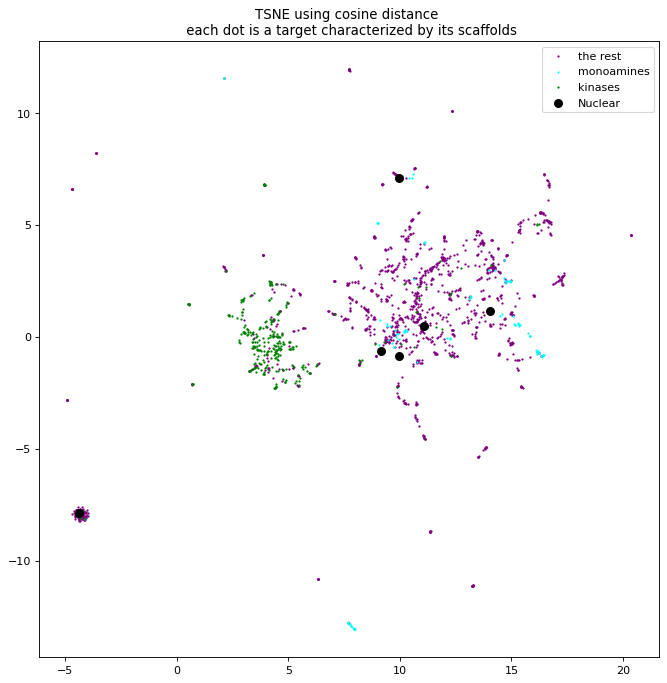

In [47]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(10, 10), dpi=80)

plt.scatter(Xo[:,0],Xo[:,1],s=1,label="the rest",c="purple")
plt.scatter(Xr[:,0],Xr[:,1],s=1,label="monoamines",c="cyan")
plt.scatter(Xk[:,0],Xk[:,1],s=1,label="kinases",c="green")
plt.scatter(Xn[:,0],Xn[:,1],s=50,label="Nuclear",c="black")
plt.legend()
plt.title("TSNE using cosine distance \n each dot is a target characterized by its scaffolds")
plt.show()

In [50]:
X_embedded

array([[10.53535   ,  5.228206  ],
       [10.130058  ,  3.6170733 ],
       [15.300358  , -1.498983  ],
       ...,
       [ 3.397238  ,  0.188875  ],
       [ 4.0788646 , -0.62333924],
       [ 3.4032037 , -0.512645  ]], dtype=float32)

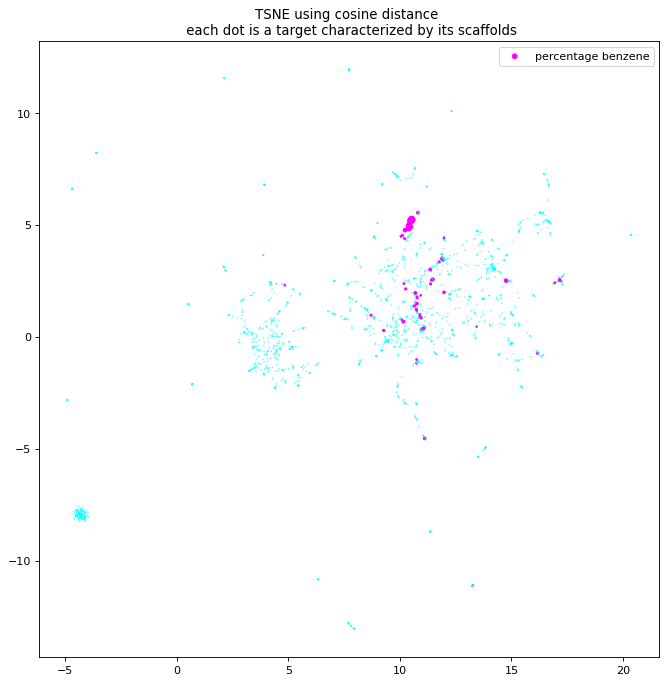

In [37]:
from matplotlib import pyplot as plt
import matplotlib.cm as cm
figure(figsize=(10, 10), dpi=80)

color = [1 if fp[0]>0.001 else 0 for fp in fps]
size = [0.1+fp[0]**0.5*50 for fp in fps]
plt.scatter(X_embedded[:,0],X_embedded[:,1],c=color,s=size,cmap="cool",label="percentage benzene")
plt.title("TSNE using cosine distance \n each dot is a target characterized by its scaffolds")
plt.legend()
plt.show()

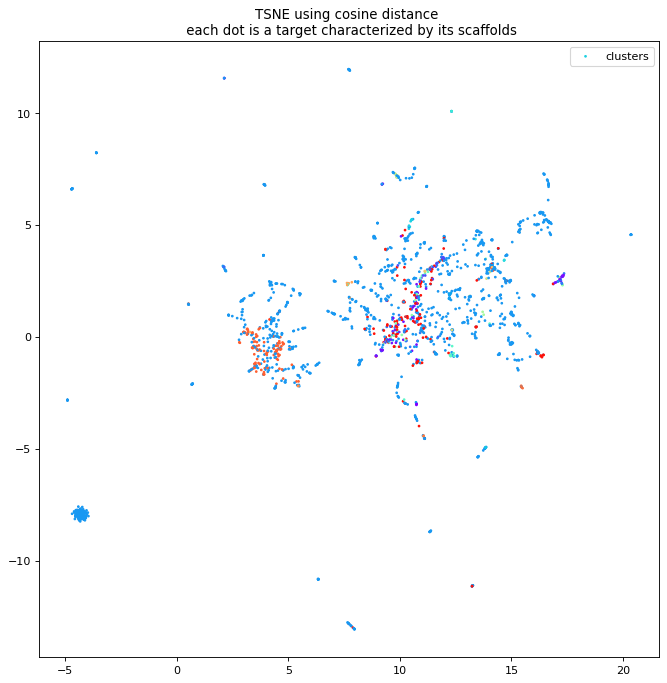

In [38]:
from matplotlib import pyplot as plt
import matplotlib.cm as cm
figure(figsize=(10, 10), dpi=80)

color = [km.labels_]
plt.scatter(X_embedded[:,0],X_embedded[:,1],s=2,c=color,cmap="rainbow",label="clusters")
plt.title("TSNE using cosine distance \n each dot is a target characterized by its scaffolds")
plt.legend()
plt.show()

In [39]:
# reversing the matrix into scaffold fingerprints
fps_scaff = [[] for x in fps[0]]
for fp in fps:
    for i,f in enumerate(fp):
        fps_scaff[i].append(f)

In [40]:
#visualize scaffolds
X_embedded_scaff = TSNE(n_components=2, perplexity=30, metric="euclidean",n_jobs=19).fit_transform(np.array(fps_scaff))

X_embedded_scaff.shape

(2790, 2)

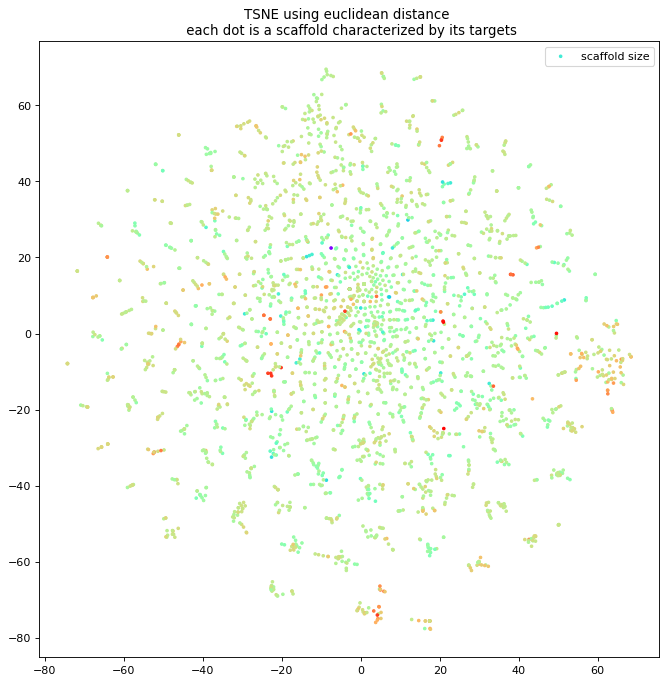

In [41]:
#visualize scaffolds
figure(figsize=(10, 10), dpi=80)

plt.scatter(X_embedded_scaff[:,0],X_embedded_scaff[:,1],c=[np.log(len(scaff)+1) for scaff in top_scaffolds],label="scaffold size",s=5,cmap="rainbow")
plt.legend()
plt.title("TSNE using euclidean distance \n each dot is a scaffold characterized by its targets")
plt.show()

# -----------------------------------------------------------------

In [52]:
#populate dict where the scaffolds occuring in each target are put into an array. take sabout 20 sec
target_scaffs = {}
for t in set(df["tid"]):
    target_scaffs[t]=[]
    
for i,mrn in enumerate(df["molregno"]):
    try:
        target_scaffs[df["tid"][i]].append(mrn2scaff[mrn])

    except:
        pass

In [53]:
target_scaffs

{1: ['C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'c1ccc([SiH2]CCCN2CCCCC2)cc1',
  'C(=C/[SiH2]c1ccccc1)\\CN1CCCCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'c1ccc(CN2CCCCC2)cc1',
  'C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'C1CCNCC1',
  'c1ccc(CCNC2CCCCC2)cc1',
  'C1CCC(NC2CCCCC2)CC1',
  'C1CCC(NC2CCCCC2)CC1',
  'C1CCC(CNC2CCCCC2)CC1',
  'C1CCC(NC2CCCCC2)CC1',
  'C1CCCCC1',
  'c1ccc(CNC2CCCCC2)cc1',
  'C1CCC(N[C@H]2CCCOC2)CC1',
  'C1CCCCC1',
  'C1CCC(NC2CCCCC2)CC1',
  'C1CCC(N[C@H]2CCCOC2)CC1',
  'c1csc(CNC2CCCCC2)c1',
  'C1CCCCC1',
  'C1CCC(N[C@@H]2CCCOC2)CC1',
  'C(=C/c1ccccc1)\\CNC1CCCCC1',
  'c1ccc(CNC2CCCCC2)cc1',
  'c1cncc(CNC2CCCCC2)c1',
  'c1ccc(CCNC2CCCCC2)cc1',
  'C1CCC(NC2CCCCC2)CC1',
  'c1ccc(CNC2CCCCC2)cc1',
  'C1CCC(N[C@@H]2CCCOC2)CC1',
  'C1CCNCC1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SH+]C1',
  'C1CC[SeH+]C1',
  'C1C

In [69]:
#populate dict where the scaffolds occuring in each target are put into an array. take sabout 20 sec
scaff_tag = {}
for molrengo,scaf in mrn2scaff.items():
    scaff_tag[scaf]=[]
    


In [ ]:
for i,mrn in enumerate(df["molregno"]):
    try:
        scaff_tag[df["tid"][i]].append(mrn2scaff[mrn])

    except:
        pass